<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1TRNaCfYstvcIQqoUSdukYQGF6LuyL7Tv" width=600 height=320/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

# Домашнее задание. Автоэнкодеры


# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (1 балл)


In [ ]:
from sklearn.model_selection import train_test_split
from torchvision.transforms import functional
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import random

In [ ]:
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
import matplotlib.pyplot as plt

import os
import pandas as pd
import skimage.io
from skimage.transform import resize


%matplotlib inline

In [ ]:
def fetch_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      dx=80,dy=80,
                      dimx=64,dimy=64
    ):

    #download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    # print(df.shape)
    #image preprocessing
    all_photos =df['photo_path'].apply(skimage.io.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: resize(img,[dimx,dimy]))

    all_photos = np.stack(all_photos.values)#.astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return all_photos, all_attrs

In [ ]:
# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind


data, attrs = fetch_dataset()


Разбейте выборку картинок на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

In [ ]:
train_photos, val_photos, train_attrs, val_attrs = train_test_split(data, attrs,
                                                                    train_size=0.9, shuffle=False, random_state = 17)

In [ ]:
def imshow(inp, title=None, plt_ax=plt, default=False):
    """Imshow для тензоров"""
    img = np.moveaxis(inp.numpy(), 0, 2)
    plt_ax.imshow(img)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

In [ ]:
class TorchImgs(Dataset):

    def __init__(self, imgs : np.ndarray):
        super().__init__()
        self.imgs = imgs
        self.len_ = len(self.imgs)

    def __len__(self):
        return self.len_

    def __getitem__(self, index):
          # трансформируем в pytorch тензор PIL(numpy) картинку HxWxC -> CxHxW
          return functional.to_tensor(self.imgs[index]).float()

In [ ]:
# загрузка датасетов
train = TorchImgs(train_photos)
val = TorchImgs(val_photos)


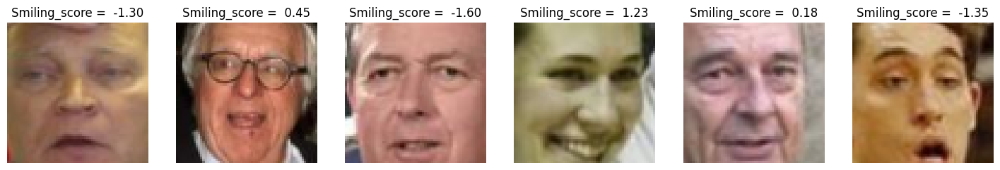

In [ ]:
# визуализация датасета
plt.figure(figsize=(18, 6))
for i in range(6):
    j = np.random.randint(0, len(train))
    smile = train_attrs.loc[j,"Smiling"]
    plt.subplot(1, 6, i+1)
    plt.axis("off")
    imshow(train[j], "Smiling_score =  %1.2f" % smile , plt_ax = plt.gca())

In [ ]:
#  даталоадеры
train_loader = torch.utils.data.DataLoader(train, batch_size=32)
val_loader = torch.utils.data.DataLoader(val, batch_size=32)

## 1.2. Архитектура модели (2 балла)
В этом разделе мы напишем и обучем обычный автоэнкодер.



<img src="https://www.notion.so/image/https%3A%2F%2Fs3-us-west-2.amazonaws.com%2Fsecure.notion-static.com%2F4b8adf79-8e6a-4b7d-9061-8617a00edbb1%2F__2021-04-30__14.53.33.png?table=block&id=56f187b4-279f-4208-b1ed-4bda5f91bfc0&width=2880&userId=3b1b5e32-1cfb-4b0f-8705-5a524a8f56e3&cache=v2" alt="Autoencoder">


^ напомню, что автоэнкодер выглядит вот так

In [ ]:
latent_dim = 200  # выберите размер латентного вектора

In [ ]:
# Define the autoencoder architecture
class Conv_Autoencoder(nn.Module):
    def __init__(self,  in_channels=3, out_channels=16, latent_dim=200):
        super().__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1), # 64x64
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1), # 64x64
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # 32x32
            nn.Conv2d(out_channels, 3*out_channels, kernel_size=3, stride=2, padding=1), # 16x16
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # 8x8
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(3*out_channels*8*8, latent_dim), # 200
            nn.ReLU()
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 3*out_channels*8*8),
            nn.ReLU(),
            nn.Unflatten(1, torch.Size([3*out_channels, 8, 8])), # 8x8
            nn.ConvTranspose2d(3*out_channels, 3*out_channels, 3, padding=1), # 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(3*out_channels, 2*out_channels, 3, padding=1,
                           stride=2, output_padding=1), # (16, 16)
            nn.ReLU(),
            nn.ConvTranspose2d(2*out_channels, out_channels, 3, padding=1,
                           stride=2, output_padding=1), # (32, 32)
            nn.ReLU(),
            nn.ConvTranspose2d(out_channels, in_channels, 3, padding=1,
                           stride=2, output_padding=1), # (64, 64)
            nn.Sigmoid()
        )

    def decode(self, latent_code):
        return self.decoder(latent_code).view(3,64,64)

    def forward(self, x):
        latent_code = self.encoder(x)
        x = self.decoder(latent_code)
        return x, latent_code

In [ ]:
autoencoder = Conv_Autoencoder()

In [ ]:
from torchsummary import summary
summary(autoencoder, (3, 64, 64), batch_size = 32)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [32, 16, 64, 64]             448
              ReLU-2           [32, 16, 64, 64]               0
            Conv2d-3           [32, 16, 64, 64]           2,320
              ReLU-4           [32, 16, 64, 64]               0
         MaxPool2d-5           [32, 16, 32, 32]               0
            Conv2d-6           [32, 48, 16, 16]           6,960
              ReLU-7           [32, 48, 16, 16]               0
         MaxPool2d-8             [32, 48, 8, 8]               0
              ReLU-9             [32, 48, 8, 8]               0
          Flatten-10                 [32, 3072]               0
           Linear-11                  [32, 200]         614,600
             ReLU-12                  [32, 200]               0
           Linear-13                 [32, 3072]         617,472
             ReLU-14                 [3

In [ ]:
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
loss_fun = nn.MSELoss(reduction = "sum")

## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэекодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

In [ ]:
class EarlyStopper:
    """
    Early stopp if val loss don't decrease for n epochs (patience)
    """
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')
        self.stopped = False

    def early_stop(self, validation_loss):
        if self.stopped:
          return False
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                self.stopped = True
                return True
        return False

In [ ]:
early_stopper = EarlyStopper(patience=3, min_delta=0.08)

In [ ]:
def save_model(curr_epoch, model, optim, log_name):
    # сохраняем модель
    torch.save({'epoch': curr_epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optim.state_dict()
        }, log_name + f"_epoch_{curr_epoch}.pt"
    )

In [ ]:
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import pickle
from time import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

writer = SummaryWriter() # Writer will output to ./runs/ directory by default.

def train(model, opt, loss_fn, epochs, data_tr, data_val,*, log_name = None):
    if log_name is None:
        raise RuntimeError("Enter log_name")

    model.to(device)
    log_template = "epoch: {ep:02d}, epoch_time: {e_time:3.3f}, train_loss: {t_loss:0.3f}, val_loss {v_loss:0.3f}"

    # для усреднения лосса
    N_tr = len(data_tr.dataset)
    N_val = len(data_val.dataset)

    curr_epoch = 0
    history = []
    for epoch in range(epochs):
        tic = time()

        # Training
        curr_epoch = epoch + 1
        train_loss = 0
        model.train()

        for batch_imgs in tqdm(data_tr, total=len(data_tr)):
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            reconstruction, latent_code = model(batch_imgs.to(device))
            loss =  loss_fn(reconstruction, batch_imgs.to(device))
            loss.backward()
            opt.step()

            # calculate loss to show the user
            train_loss += loss                                 # TB
        toc = time()

        # Validation
        val_loss = 0
        model.eval()
        for batch_imgs in data_val:
            with torch.no_grad():
                reconstruction, _ = model(batch_imgs.to(device))
                loss = loss_fn(reconstruction, batch_imgs.to(device))

            val_loss += loss                                     # TB


        # Print log
        print(log_template.format(ep = epoch + 1, e_time =  toc - tic, t_loss = train_loss/N_tr, v_loss = val_loss/N_val))
        history.append(((train_loss/N_tr).cpu().item(), (val_loss/N_val).cpu().item()))
        writer.add_scalars('Losses', {'train_loss': train_loss/N_tr,
                                'val_loss': val_loss/N_val}, epoch+1)

        # Visualize random 6 images from 1 batch
        batch_size = 32
        indx = np.random.randint(0,batch_size - 6)
        val_imgs = next(iter(data_val))[indx : indx + 6]

        with torch.no_grad():
            reconstructed, _ = model(val_imgs.to(device))

        plt.figure(figsize=(18,6))
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.axis("off")
            imshow(val_imgs[k], plt_ax = plt.gca())

            plt.subplot(2, 6, k+7)
            plt.axis("off")
            imshow(reconstructed[k].detach().cpu(), plt_ax = plt.gca())
        plt.show()


        # Early stopping
        if early_stopper.early_stop(val_loss/N_val):
            save_model(curr_epoch, model, opt, log_name)

    save_model(curr_epoch, model, opt, log_name)
    # сохраняем кривые обучения для отчёта
    with open(log_name + ".pickle", 'wb') as handle:
        pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)

    writer.flush()
    writer.close()

    return history

In [ ]:
max_epochs = 70
log1 = train(autoencoder, optimizer, loss_fun, max_epochs, train_loader, val_loader, log_name="autoencoder_log")

In [ ]:
!cp /content/autoencoder_log.pickle /content/drive/MyDrive/"Colab Notebooks"/"Machine Learning"/MIPT_Sem_1/Autoencoders/HW

In [ ]:
# загрузка обученного автоэнкодера
from google.colab import drive
drive.mount('/content/drive')
device = torch.device('cpu')
checkpoint = torch.load("/content/drive/MyDrive/Colab Notebooks/Machine Learning/MIPT_Sem_1/Autoencoders/HW/autoencoder_log_epoch_32.pt", map_location=device)
autoencoder = Conv_Autoencoder()
autoencoder.load_state_dict(checkpoint['model_state_dict'])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<All keys matched successfully>

Давайте посмотрим, как наш тренированный автоэекодер кодирует и восстанавливает картинки:

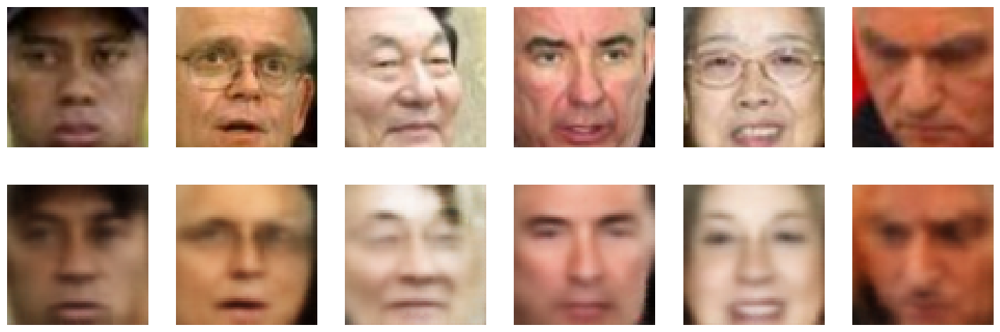

In [ ]:
plt.figure(figsize=(18,6))
for k in range(6):
  indx = np.random.randint(0, len(val))
  with torch.no_grad():
      reconstructed, _ = autoencoder(val[indx].view(-1,3,64,64))

  plt.subplot(2, 6, k+1)
  plt.axis("off")
  imshow(val[indx], plt_ax = plt.gca())

  plt.subplot(2, 6, k+7)
  plt.axis("off")
  imshow(reconstructed.view(3,64,64), plt_ax = plt.gca())
plt.show()

Not bad, right?

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэекодер и получать реконструкцию, а попробуем создать что-то НОВОЕ

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__Е сли вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

**Попытка напрямую сгенерировать случайные лица используя нормальное стандартное распределения не приводит к успеху**

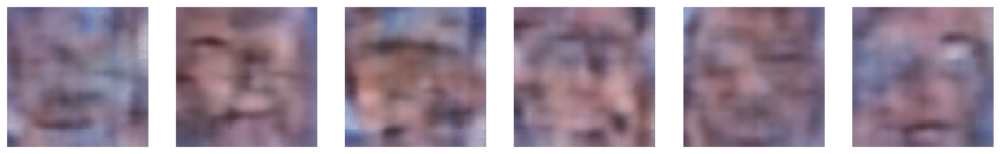

In [ ]:
# сгенерируем 25 рандомных векторов размера latent_space (видим total mess)
latent_space_dim = 200
latent_codes = np.random.randn(6, latent_space_dim)

plt.figure(figsize=(18,6))
for k in range(len(latent_codes)):
  with torch.no_grad():
      generated = autoencoder.decode(torch.from_numpy(latent_codes[k]).view(-1, latent_space_dim).float())

  plt.subplot(1, 6, k+1)
  plt.axis("off")
  imshow(generated, plt_ax = plt.gca())

plt.show()


**Оценим распределение векторов в latent space используя kernel estimation и PCA, т.к. в 200 мерном пространстве наши "лица" лежат на многообразии меньшей размерности**

In [ ]:
# оценим распределение векторов в latent_space на основе N латентных векторов из трейна
N = 5000
sample = next(iter(torch.utils.data.DataLoader(train, batch_size= N, shuffle = True)))

with torch.no_grad():
    _, latent_vecs = autoencoder(sample)
z_vecs = latent_vecs.numpy()

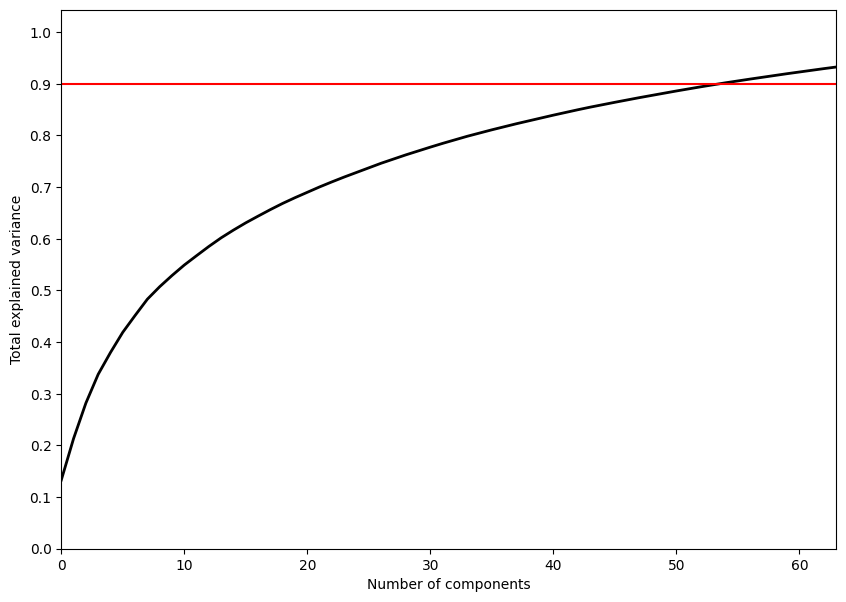

In [ ]:
# dimensionality reduction, т.к. данные лежат в некотором подмногообразии 200 мерного пространства
from sklearn.decomposition import PCA
center = z_vecs.mean(axis = 0) # центрируем облако перед PCA
z_vecs -= center
pca = PCA().fit(z_vecs)
# Из графика видно, чтобы объяснить 90% вариации данных в 200 мерном пространстве, достаточно взять 55 главных компонент
plt.figure(figsize=(10,7))
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='k', lw=2)
plt.xlabel('Number of components')
plt.ylabel('Total explained variance')
plt.xlim(0, 63)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.axhline(0.9, c='r')
plt.show();

In [ ]:
# Возьмём первые 55 компонент (также можно попытаться переобучить модель с размерностью latent space = 55 )
pca = PCA(n_components = 55)
princip_comps = pca.fit_transform(z_vecs)

# kernel estimation в 55 мерном пространстве
from scipy import stats
kernel = stats.gaussian_kde(princip_comps.T)


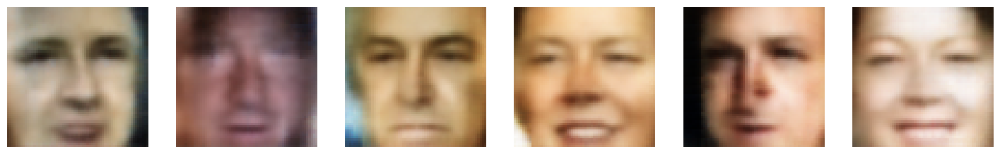

In [ ]:
# sample data  из оценненного распределения в 55 мерном про пространстве
randm_pts = kernel.resample(6).T

# обратная проекция в 200 мерное пространтсво
W = pca.components_
randm_faces = randm_pts @ W + center

# визуализация
latent_space_dim = 200
latent_codes = randm_faces

plt.figure(figsize=(18,6))
for k in range(len(latent_codes)):
  with torch.no_grad():
      generated = autoencoder.decode(torch.from_numpy(latent_codes[k]).view(-1, latent_space_dim).float())

  plt.subplot(1, 6, k+1)
  plt.axis("off")
  imshow(generated, plt_ax = plt.gca())

plt.show()


## 1.5 Time to make fun! (3 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с описанием датасета, скачанный вместе с датасетом. В нем указаны имена картинок и присутствубщие атрибуты (улыбки, очки...)

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

In [ ]:
# поработам с аттрибьютом улыбки
attrs["Smiling"] = attrs["Smiling"].astype('float')

In [ ]:
attrs["Smiling"].describe()

count    13143.000000
mean        -0.150700
std          1.127722
min         -2.686594
25%         -1.065725
50%         -0.320783
75%          0.766401
max          2.839994
Name: Smiling, dtype: float64

In [ ]:
# индексы наверняка улыбающихся людей на основании score из поля Smiling из Attributes
happy_indx = attrs.index[attrs['Smiling'] > 2.0].tolist()
happy_faces = data[happy_indx]

In [ ]:
# индексы грустных людей
sad_indx = attrs.index[attrs['Smiling'] < -2.0].tolist()
sad_faces = data[sad_indx]

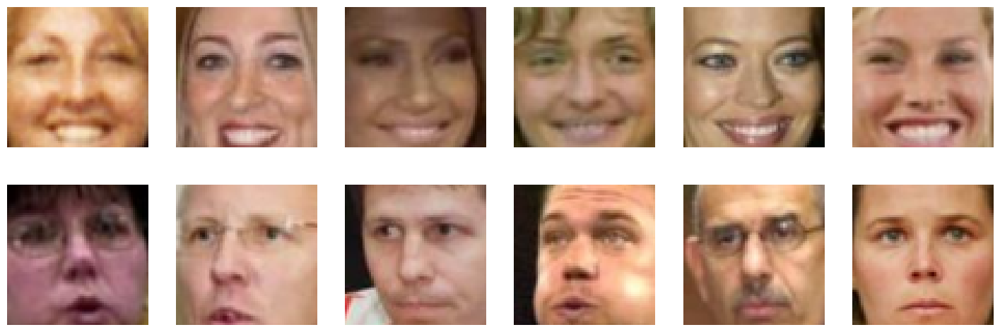

In [ ]:
# посмотрим на улыбающихся и грустных людей
plt.figure(figsize=(18,6))
for k in range(6):
  plt.subplot(2, 6, k+1)
  plt.axis("off")
  plt.imshow(data[random.choice(happy_indx)])

  plt.subplot(2, 6, k+7)
  plt.axis("off")
  plt.imshow(data[random.choice(sad_indx)])
plt.show()

In [ ]:
happy_dataset = TorchImgs(happy_faces)
sad_dataset = TorchImgs(sad_faces)

In [ ]:
def avg_latent_vec(dataset, model, latent_dim):
  vect = np.zeros((len(dataset), latent_dim))
  for i, sample in enumerate(dataset):
    with torch.no_grad():
      _, latent_vec = model(sample.view(-1, 3, 64, 64))
    vect[i] = latent_vec.view(200).numpy()
  return np.mean(vect, axis = 0)


In [ ]:
# разница happy - sad  в латентном пространстве
happy_avg = avg_latent_vec(happy_dataset, autoencoder, 200)
sad_avg = avg_latent_vec(sad_dataset, autoencoder, 200)
delta_smile = happy_avg - sad_avg

**Пририсуем улыбки людям**

In [ ]:
def make_smiling(model, face, smile_vec):
  with torch.no_grad():
      _, sad_face_vec = model(face.view(-1, 3, 64, 64))
  smile_face_vec = sad_face_vec + torch.from_numpy(smile_vec).view(-1,200).float()
  with torch.no_grad():
      smiling_face = model.decode(smile_face_vec)
  return smiling_face

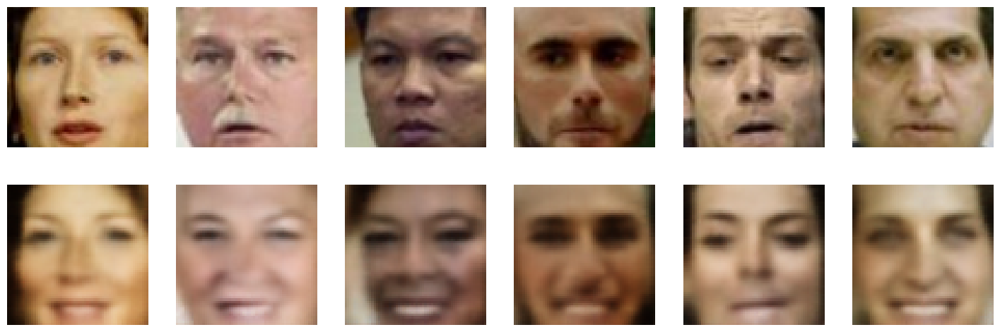

In [ ]:
plt.figure(figsize=(18,6))
for k in range(6):
  indx = np.random.randint(0, len(sad_dataset))

  plt.subplot(2, 6, k+1)
  plt.axis("off")
  imshow(sad_dataset[indx], plt_ax = plt.gca())

  plt.subplot(2, 6, k+7)
  plt.axis("off")
  imshow(make_smiling(autoencoder, sad_dataset[indx], delta_smile), plt_ax = plt.gca())
plt.show()

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии и на что есть атрибуты в `all_attrs`:)

# Часть 2: Variational Autoencoder (10 баллов)

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [ ]:
batch_size = 32
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 37224368.67it/s]


Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 1098218.47it/s]


Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 10211590.24it/s]


Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 2568495.18it/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



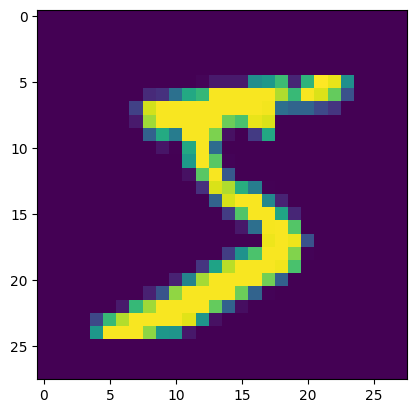

In [ ]:
imshow(train_dataset[0][0])

## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

Математика автоэнкодеров https://towardsdatascience.com/understanding-variational-autoencoders-vaes-f70510919f73 \\
$p(z|x) \sim p(x|z) p(z)$, где \\
$p(z|x)$ - probabilistic encoder \\
$p(x|z)$ - probabilistic decoder \\
$p(z)$ - prior over latent space \\
Хотим найти $p(z|x)$ решая Bayesian Inference Problem (постериорная вероятность известна с точностью до константы, т.к. интеграл знаменателя (evidence) часто intractable в многомерных пространствах) методом Variational Inference. \\
Идея метода Variational Inference: приблизить $p(z|x)$ некоторым $q(z|x)$  и мерой сходства распределений будет $D_{KL}(p(z|x)||q(z|x))$. \\
Сделаем предположения о prior: $p(z) \sim N(\vec0,\vec1)$ \\
Распределения для декодера $p(x|z) \sim N(\vec f(z), \vec c)$  \\
Распределение приближающее энкодер будет $q(z|x) \sim N(\vec \mu(x), \vec \sigma(x))$  \\
Таким образом надо найти функции: $\vec f(z), \vec  \mu(x), \vec \sigma(x)$, которые реализуются в слоях variational autoencoder и ищутся градиентным спуском: \\
$f^*, \mu^*, \sigma^* = argmin_{f, \mu, \sigma} ||x - f(z)||^2 + D_{KL}(N(\vec \mu(x), \vec \sigma(x)) || N(\vec0,\vec1))$  \\
Выражение имеет стандартные члены возникающие при применении bayesian inference.
Первый член - ошибка реконструкции, вместо MSE может быть и кросс-энтропия, если в качестве  $p(x|z)$ выбрано мультиномиальное распределение. Второй член - насколько сильно постериорное распределения в латентном пространстве отличается от априорного (которое хотим иметь стандартным нормальным для простоты генерации нового контента)




In [ ]:
# Creating a PyTorch class
# 28*28 ==> 2*2  ==> 28*28
class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        # 784 ==> 2 (Двумерное нормальное распределение с 4 параметраими mu1, mu2, logsigma1, logsigma2)
        self.encoder = torch.nn.Sequential(
            torch.nn.Flatten(),
            torch.nn.Linear(28 * 28, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, 64),
            torch.nn.ReLU(),
            torch.nn.Linear(64, 16),
            torch.nn.ReLU(),
            torch.nn.Linear(16, 4),
            torch.nn.ReLU()
        )

        # Add mu and log_var layers for reparameterization
        self.mu = nn.Linear(4, 2)
        self.log_var = nn.Linear(4, 2)

        # 2 ==> 784
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(2, 16),
            torch.nn.ReLU(),
            torch.nn.Linear(16, 64),
            torch.nn.ReLU(),
            torch.nn.Linear(64, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, 28*28),
            torch.nn.Sigmoid(),
            nn.Unflatten(1, torch.Size([1, 28, 28]))
        )

    def encode(self, x):
        x = self.encoder(x)
        mu = self.mu(x)
        logvar = self.log_var(x)

        return mu, logvar

    def gaussian_sampler(self, mu, logvar):
        """
        :param mu: mean from the encoder's latent space
        :param logvar: log variance from the encoder's latent space
        """
        if self.training:
            std = torch.exp(0.5 * logvar) # standard deviation
            eps = torch.randn_like(std) # `randn_like` as we need the same size
            return mu + (eps * std) # sampling as if coming from the input space
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.gaussian_sampler(mu, logvar)
        reconstruction = self.decode(z)
        return mu, logvar, reconstruction

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [ ]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    loss = -0.5 * torch.sum(1 + logsigma - mu.pow(2) - logsigma.exp())
    return loss

def log_likelihood(x, reconstruction):
    """
    часть функции потерь, которая отвечает за качество реконструкции (как mse в обычном autoencoder)
    """
    loss = nn.BCELoss(reduction='sum')
    return loss(reconstruction, x)

def loss_vae(x, mu, logsigma, reconstruction):
    return log_likelihood(x, reconstruction) + KL_divergence(mu, logsigma)

И обучим модель:

In [ ]:
autoencoder = VAE()

In [ ]:
criterion = loss_vae



optimizer = torch.optim.Adam(autoencoder.parameters())
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size= 20, gamma=0.1)

NameError: name 'autoencoder' is not defined

In [ ]:
from torchsummary import summary
summary(autoencoder, (1, 28, 28), batch_size = 32)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [32, 784]               0
            Linear-2                  [32, 256]         200,960
              ReLU-3                  [32, 256]               0
            Linear-4                   [32, 64]          16,448
              ReLU-5                   [32, 64]               0
            Linear-6                   [32, 16]           1,040
              ReLU-7                   [32, 16]               0
            Linear-8                    [32, 4]              68
              ReLU-9                    [32, 4]               0
           Linear-10                    [32, 2]              10
           Linear-11                    [32, 2]              10
           Linear-12                   [32, 16]              48
             ReLU-13                   [32, 16]               0
           Linear-14                   

In [ ]:
class EarlyStopper:
    """
    Early stopp if val loss don't decrease for n epochs (patience)
    """
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')
        self.stopped = False

    def early_stop(self, validation_loss):
        if self.stopped:
          return False
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                self.stopped = True
                return True
        return False

In [ ]:
early_stopper = EarlyStopper(patience=5, min_delta=0.08)

In [ ]:
def save_model(curr_epoch, model, optim, log_name):
    # сохраняем модель
    torch.save({'epoch': curr_epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optim.state_dict()
        }, log_name + f"_epoch_{curr_epoch}.pt"
    )

In [ ]:
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import pickle
from time import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

writer = SummaryWriter() # Writer will output to ./runs/ directory by default.

def train(model, opt, scheduler, loss_fn, epochs, data_tr, data_val,*, log_name = None):
    if log_name is None:
        raise RuntimeError("Enter log_name")

    model.to(device)
    log_template = "epoch: {ep:02d}, epoch_time: {e_time:3.3f}, train_loss: {t_loss:0.3f}, val_loss {v_loss:0.3f}"

    # для усреднения лосса
    N_tr = len(data_tr.dataset)
    N_val = len(data_val.dataset)

    curr_epoch = 0
    history = []
    for epoch in range(epochs):
        tic = time()

        # Training
        curr_epoch = epoch + 1
        train_loss = 0
        model.train()

        for batch_imgs in tqdm(data_tr, total=len(data_tr)):
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            mu, logvar, reconstruction = model(batch_imgs[0].to(device))
            loss =  loss_fn(batch_imgs[0].to(device), mu, logvar, reconstruction)
            loss.backward()
            opt.step()

            # calculate loss to show the user
            train_loss += loss                                 # TB
        toc = time()

        # Validation
        val_loss = 0
        model.eval()
        for batch_imgs in data_val:
            with torch.no_grad():
                mu, logvar, reconstruction = model(batch_imgs[0].to(device))
                loss = loss_fn(batch_imgs[0].to(device), mu, logvar, reconstruction)

            val_loss += loss                                     # TB


        # Print log
        print(log_template.format(ep = epoch + 1, e_time =  toc - tic, t_loss = train_loss/N_tr, v_loss = val_loss/N_val))
        history.append(((train_loss/N_tr).cpu().item(), (val_loss/N_val).cpu().item()))
        writer.add_scalars('Losses', {'train_loss': train_loss/N_tr,
                                'val_loss': val_loss/N_val}, epoch+1)

        # Visualize random 6 images from 1 batch
        batch_size = 32
        indx = np.random.randint(0,batch_size - 6)
        val_imgs = next(iter(data_val))[0][indx : indx + 6]

        with torch.no_grad():
            _,_, reconstructed = model(val_imgs.to(device))

        plt.figure(figsize=(18,6))
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.axis("off")
            imshow(val_imgs[k], plt_ax = plt.gca())

            plt.subplot(2, 6, k+7)
            plt.axis("off")
            imshow(reconstructed[k].detach().cpu(), plt_ax = plt.gca())
        plt.show()


        # Early stopping
        if early_stopper.early_stop(val_loss/N_val):
            save_model(curr_epoch, model, opt, log_name)

    # lr decay
    scheduler.step()
    save_model(curr_epoch, model, opt, log_name)
    # сохраняем кривые обучения для отчёта
    with open(log_name + ".pickle", 'wb') as handle:
        pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)

    writer.flush()
    writer.close()

    return history

In [ ]:
max_epochs = 50
log2 = train(autoencoder, optimizer, scheduler, criterion, max_epochs, train_loader, test_loader, log_name="VAE_MNIST_log")

In [ ]:
# Tensorboard
!rm -rf ./runs/ #to delete previous runs

#%load_ext tensorboard
#%reload_ext tensorboard
%load_ext tensorboard
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# загрузка обученного автоэнкодера
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device('cpu')
checkpoint = torch.load("/content/drive/MyDrive/Colab Notebooks/Machine Learning/MIPT_Sem_1/Autoencoders/HW/VAE_MNIST_log_epoch_50.pt", map_location=device)
autoencoder = VAE()
autoencoder.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

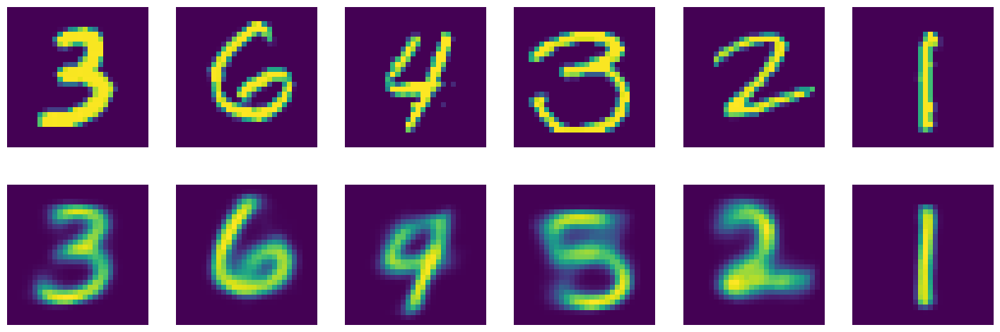

In [ ]:
plt.figure(figsize=(18,6))
for k in range(6):
  indx = np.random.randint(0, len(test_dataset))
  with torch.no_grad():
      _, _, reconstructed = autoencoder(test_dataset[indx][0].view(-1,1,28,28))

  plt.subplot(2, 6, k+1)
  plt.axis("off")
  imshow(test_dataset[indx][0], plt_ax = plt.gca())

  plt.subplot(2, 6, k+7)
  plt.axis("off")
  imshow(reconstructed.view(1,28,28), plt_ax = plt.gca())
plt.show()

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

Наше распределение на латентном пространстве стремилось быть похожим на  prior в соответсвии с лосс-функцией: $p(z) \sim N(\vec0,\vec1)$, поэтому сэмплинг их стандартного нормального распределения должен работать для генерации нового контента, в отличие от стандартного автоэнкодера

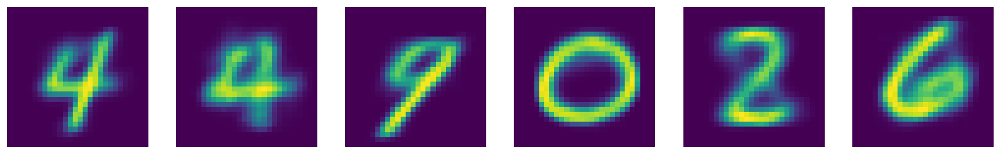

In [ ]:
# сгенерируем 6 рандомных векторов размера latent_space (видим total mess)
latent_space_dim = 2
latent_codes = np.random.randn(6, latent_space_dim)

plt.figure(figsize=(18,6))
for k in range(len(latent_codes)):
  with torch.no_grad():
      generated = autoencoder.decode(torch.from_numpy(latent_codes[k]).view(-1, latent_space_dim).float())

  plt.subplot(1, 6, k+1)
  plt.axis("off")
  imshow(generated.view(1,28,28), plt_ax = plt.gca())

plt.show()

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок цифр выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве.

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве.

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

**Размерность латентного пространства уже 2, поэтому t-SNE использовать не будем и на прямую будем строить латентное пространтсво для тестового датасета. В качестве латентного вектора для картинки x будем выводить центр соответсвующего нормального распределения mu**

In [ ]:
latent_vectors = np.zeros((len(test_dataset),2))
labels = np.zeros(len(test_dataset))
for i, digit in enumerate(test_dataset):
  with torch.no_grad():
    autoencoder.eval() # в eval mode выход VAE детерминирован
    mu, _, _ = autoencoder(digit[0].view(-1,1,28,28))
  latent_vectors[i] = mu.numpy()
  labels[i] = digit[1]

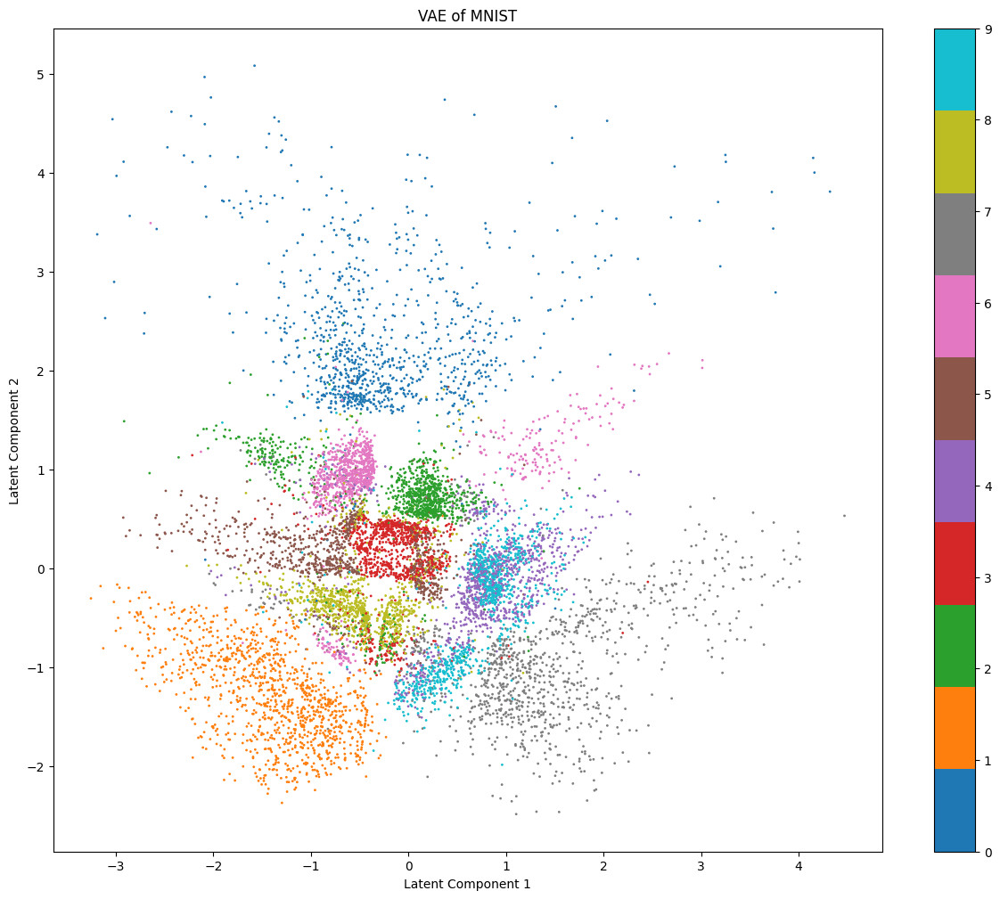

In [ ]:
# Plotting with Matplotlib
plt.figure(figsize=(15, 12))
scatter = plt.scatter(latent_vectors[:,0], latent_vectors[:,1], c = labels.astype(int), cmap='tab10', s=1)
plt.colorbar(scatter)
plt.title('VAE of MNIST')
plt.xlabel('Latent Component 1')
plt.ylabel('Latent Component 2')
plt.show()

**Построим t-SNE на картинках для сравнени с представлением выданным нашим VAE выше**

In [ ]:
flatten_imgs = np.zeros((len(test_dataset), 28*28))
for i, img in enumerate(test_dataset):
  flatten_imgs[i] = img[0].numpy().flatten()

In [ ]:
from sklearn.manifold import TSNE
# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
mnist_tsne = tsne.fit_transform(flatten_imgs)

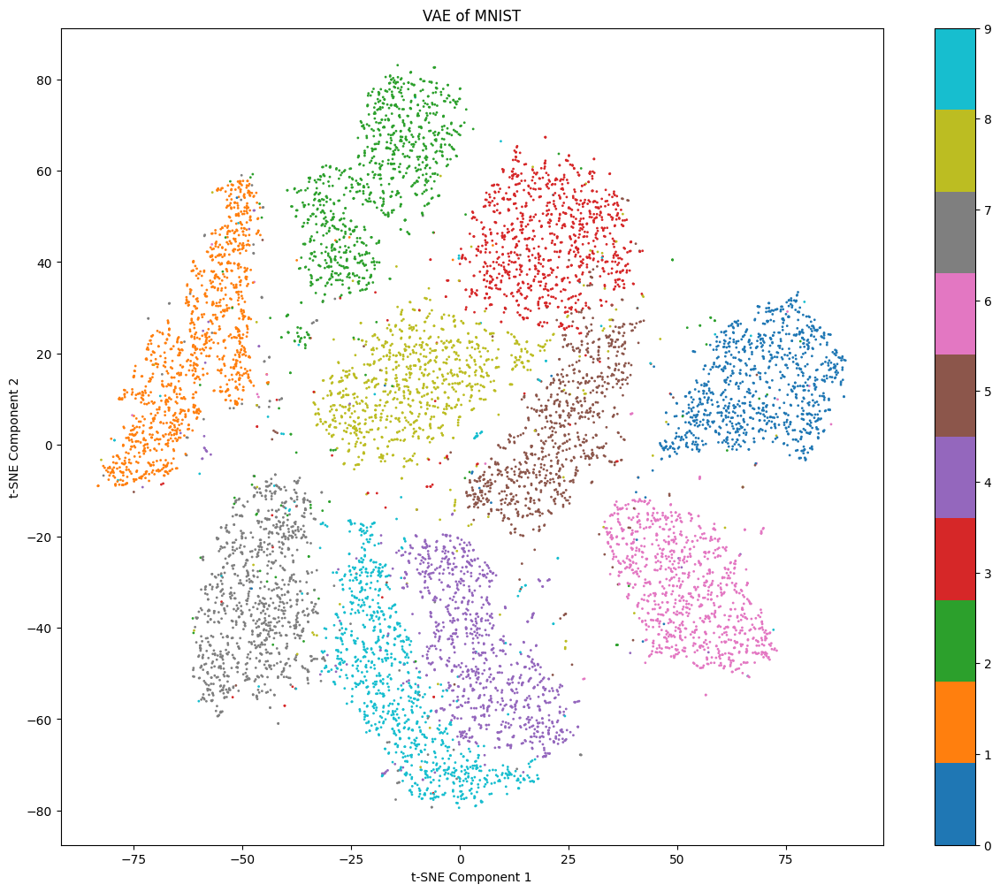

In [ ]:
# Plotting with Matplotlib
plt.figure(figsize=(15, 12))
scatter = plt.scatter(mnist_tsne[:,0], mnist_tsne[:,1], c = labels.astype(int), cmap='tab10', s=1)
plt.colorbar(scatter)
plt.title('VAE of MNIST')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

Что вы думаете о виде латентного представления?

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер.
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица).
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки.

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

**Математика CVAE**  \\
 https://towardsdatascience.com/understanding-conditional-variational-autoencoders-cd62b4f57bf8 \\
 https://avandekleut.github.io/vae/ \\
 https://medium.com/@sofeikov/implementing-conditional-variational-auto-encoders-cvae-from-scratch-29fcbb8cb08f \\


 Обычный VAE энкодер:
 $x -> q_{\phi}(z|x) -> z -> p_{\theta}(x|z) -> \hat x$. \\
 Где $q_{\phi}(z|x)$ должно быть похоже на prior $p(z)$, в соответствии с членом KL-divergence из лосс функции \\

Conditional VAE энкодер:
 $x,y -> q_{\phi}(z|x,y) -> z,y -> p_{\theta}(x|z,y) -> \hat x$. \\
Т.е. передаётся дополнительная кодировка класса  y, который хотим сгенерировать. А  $q_{\phi}(z|x,y)$ аппроксимирует prior услловно зависящее от y, т.е. $p(z|y)$

In [ ]:
class Encoder(nn.Module):
  def __init__(self, latent_dims, n_classes):
    super(Encoder, self).__init__()

    self.feature_extractor = nn.Sequential(
        nn.Conv2d(1, 32, stride=(1, 1), kernel_size=(3, 3), padding=1), # 32x28x28
        nn.LeakyReLU(0.01),
        nn.Conv2d(32, 64, stride=(2, 2), kernel_size=(3, 3), padding=1), # 64x14x14
        nn.LeakyReLU(0.01),
        nn.Conv2d(64, 64, stride=(2, 2), kernel_size=(3, 3), padding=1), # 64x7x7
        nn.LeakyReLU(0.01),
        nn.Conv2d(64, 64, stride=(2, 2), kernel_size=(3, 3), padding=1), #64x4x4
        nn.Flatten()
    )

    self.mu = nn.Sequential(
        nn.Linear(1024 + n_classes, 128), # concatenate x with y
        nn.LeakyReLU(0.01),
        nn.Linear(128, latent_dims)
    )

    self.logvar = nn.Sequential(
        nn.Linear(1024 + n_classes, 128),
        nn.LeakyReLU(0.01),
        nn.Linear(128, latent_dims)
    )

  def forward(self, x, y):
    x = self.feature_extractor(x)
    mu = self.mu(torch.cat((x,y),dim=1)) # y - one-hot encoded class concatenated
    logvar = self.logvar(torch.cat((x,y),dim=1))
    return mu, logvar

In [ ]:
class Decoder(nn.Module):
  def __init__(self, latent_dims, n_classes):
    super(Decoder, self).__init__()
    self.decoder = nn.Sequential(
        torch.nn.Linear(latent_dims + n_classes, 1024),
        nn.Unflatten(1, torch.Size([64, 4, 4])),
        nn.ConvTranspose2d(64, 64, stride=(2, 2), kernel_size=(3, 3), padding=1), #64x7x7
        nn.LeakyReLU(0.01),
        nn.ConvTranspose2d(64, 64, stride=(2, 2), kernel_size=(3, 3), padding=1, output_padding=1), #64x14x14
        nn.LeakyReLU(0.01),
        nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=1,  output_padding=1), #32x28x28
        nn.LeakyReLU(0.01),
        nn.ConvTranspose2d(32, 1, stride=(1, 1), kernel_size=(3, 3), padding=1), #1x28x28
        nn.Sigmoid()
        )
  def forward(self, z, y):
    x = self.decoder(torch.cat((z,y),dim=1))
    return x

In [ ]:
class CVAE(nn.Module):
    def __init__(self,latent_dims, n_classes):
        super(CVAE, self).__init__()
        self.encoder = Encoder(latent_dims, n_classes)
        self.decoder = Decoder(latent_dims, n_classes)
        self.n_classes = n_classes
    def encode(self, x, class_num):
        y = nn.functional.one_hot(class_num, self.n_classes)
        mu, logvar = self.encoder(x, y)
        return mu, logvar, class_num

    def gaussian_sampler(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5 * logvar) # standard deviation
            eps = torch.randn_like(std) # `randn_like` as we need the same size
            return mu + (eps * std) # sampling as if coming from the input space
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z, class_num):
        y = nn.functional.one_hot(class_num, self.n_classes)
        reconstruction = self.decoder(z, y)
        return reconstruction

    def forward(self, x, class_num):
        mu, logvar, _ = self.encode(x, class_num)
        z = self.gaussian_sampler(mu, logvar)
        reconstruction = self.decode(z, class_num)
        return mu, logvar, reconstruction

In [ ]:
cvae = CVAE(10, 10)

In [ ]:
print("Trainable parameters: %d" %sum(p.numel() for p in cvae.parameters() if p.requires_grad))

Trainable parameters: 474325


### Training

In [ ]:
criterion = loss_vae
optimizer = torch.optim.Adam(cvae.parameters(), lr=0.01)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones = [5, 40, 70], gamma=0.1)

In [ ]:
class EarlyStopper:
    """
    Early stopp if val loss don't decrease for n epochs (patience)
    """
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')
        #self.stopped = False

    def early_stop(self, validation_loss):
        #if self.stopped:
        #  return False
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                #self.stopped = True
                self.counter = 0
                return True
        return False

In [ ]:
early_stopper = EarlyStopper(patience=5, min_delta=0.08)

In [ ]:
def save_model(curr_epoch, model, optim, log_name):
    # сохраняем модель
    torch.save({'epoch': curr_epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optim.state_dict()
        }, log_name + f"_epoch_{curr_epoch}.pt"
    )

In [ ]:
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import pickle
from time import time
import gc

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

writer = SummaryWriter() # Writer will output to ./runs/ directory by default.

def train(model, opt, scheduler, loss_fn, epochs, data_tr, data_val,*, log_name = None):
    if log_name is None:
        raise RuntimeError("Enter log_name")

    model.to(device)
    log_template = "epoch: {ep:02d}, epoch_time: {e_time:3.3f}, train_loss: {t_loss:0.3f}, val_loss {v_loss:0.3f}"

    # для усреднения лосса
    N_tr = len(data_tr.dataset)
    N_val = len(data_val.dataset)

    curr_epoch = 0
    history = []
    for epoch in range(epochs):
        tic = time()

        # Training
        curr_epoch = epoch + 1
        train_loss = 0
        model.train()

        for batch_imgs, batch_labels in tqdm(data_tr, total=len(data_tr)):
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            mu, logvar, reconstruction = model(batch_imgs.to(device), batch_labels.to(device))
            loss =  loss_fn(batch_imgs.to(device), mu, logvar, reconstruction)
            loss.backward()
            opt.step()

            # calculate loss to show the user
            train_loss += loss.detach()  # важно не тащить за собой вычислительный граф, а о RAM  будет забиваться за эпоху
        toc = time()

        # Validation
        val_loss = 0
        model.eval()
        for batch_imgs, batch_labels in data_val:
            with torch.no_grad():
                mu, logvar, reconstruction = model(batch_imgs.to(device), batch_labels.to(device))
                loss = loss_fn(batch_imgs.to(device), mu, logvar, reconstruction)

            val_loss += loss.detach()                                     # TB


        # Print log
        print(log_template.format(ep = epoch + 1, e_time =  toc - tic, t_loss = train_loss/N_tr, v_loss = val_loss/N_val))
        history.append(((train_loss/N_tr).cpu().item(), (val_loss/N_val).cpu().item()))
        writer.add_scalars('Losses', {'train_loss': train_loss/N_tr,
                                'val_loss': val_loss/N_val}, epoch+1)

        # Visualize random 6 images from 1 batch
        batch_size = 32
        indx = np.random.randint(0,batch_size - 6)
        imgs, labels = next(iter(data_val))
        val_imgs = imgs[indx : indx + 6]
        val_labels = labels[indx : indx + 6]
        with torch.no_grad():
            _,_, reconstructed = model(val_imgs.to(device), val_labels.to(device))

        plt.figure(figsize=(18,6))
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.axis("off")
            imshow(val_imgs[k], plt_ax = plt.gca())

            plt.subplot(2, 6, k+7)
            plt.axis("off")
            imshow(reconstructed[k].detach().cpu(), plt_ax = plt.gca())
        plt.show()

        gc.collect()

        # Early stopping
        if early_stopper.early_stop(val_loss/N_val):
            save_model(curr_epoch, model, opt, log_name)

    # lr decay
    scheduler.step()
    save_model(curr_epoch, model, opt, log_name)
    # сохраняем кривые обучения для отчёта
    with open(log_name + ".pickle", 'wb') as handle:
        pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)

    writer.flush()
    writer.close()

    return history

In [ ]:
max_epochs = 80
log3 = train(cvae, optimizer, scheduler, criterion, max_epochs, train_loader, test_loader, log_name="CVAE_MNIST_log")

### Sampling


In [ ]:
# загрузка обученного автоэнкодера
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device('cpu')
checkpoint = torch.load("/content/drive/MyDrive/Colab Notebooks/Machine Learning/MIPT_Sem_1/Autoencoders/HW/CVAE_MNIST_log_epoch_80.pt", map_location=device)
latent_dims = 10
n_classes = 10
cvae = CVAE(latent_dims, n_classes)
cvae.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

In [ ]:
def generate_10_digits(model, z, row, rows = 10, cols = 10):
  # Generate
  classes = np.arange(0,10)
  # temp = np.zeros((10,10))
  # temp[:] = z
  temp = np.tile(z, (rows,1))
  latent_vector = torch.from_numpy(temp).float()
  with torch.no_grad():
    rec = model.decode(latent_vector, torch.from_numpy(classes))

  # Visualize
  plt.figure(figsize=(18,6))
  for k,img in enumerate(rec):
    plt.subplot(rows, cols, k+row*cols + 1)
    plt.axis("off")
    imshow(img, plt_ax = plt.gca())

In [ ]:
a = np.zeros((2,2))
b = np.array([1,3])
a[:] = b
a

array([[1., 3.],
       [1., 3.]])

In [ ]:
np.tile(b, (2,1))

array([[1, 3],
       [1, 3]])

<Figure size 1800x600 with 0 Axes>

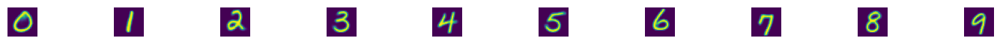

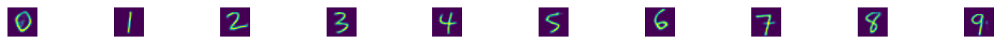

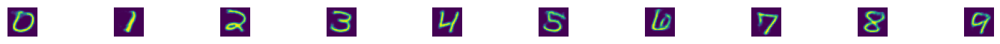

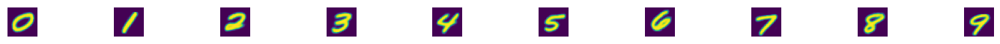

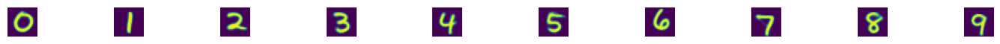

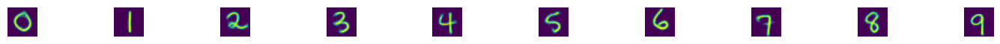

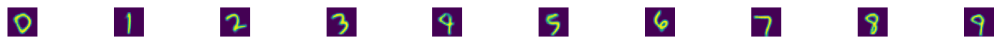

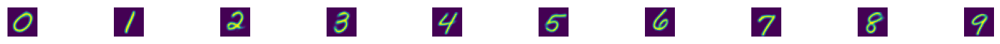

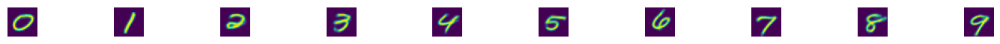

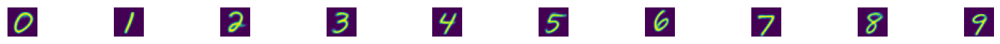

In [ ]:
# Засэмплируем для 10 случайных латентных векторов, все возможные цифры
# Как видно из любого латентного вектора можно получить любую цифру задавая нужное условие
latent_space_dim = 10
latent_codes = np.random.randn(10, latent_space_dim)

plt.figure(figsize=(18,6))
for i, z in enumerate(latent_codes):
  generate_10_digits(cvae, z, i)

plt.show()

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.
У нас латентное пространство размерности 10, поэтому будем использовать t-SNE для проекции его на 2-х мерное пространтсво с целью визуализации

In [ ]:
# Генерируем латентые вектора теста в 10 мерном пространстве
latent_dims = 10
latent_vectors = np.zeros((len(test_dataset),latent_dims))
labels = np.zeros(len(test_dataset))
for i, digit in enumerate(test_dataset):
  with torch.no_grad():
    cvae.eval() # в eval mode выход VAE детерминирован
    mu, _, _ = cvae(digit[0].view(-1,1,28,28), torch.tensor([digit[1]]))
  latent_vectors[i] = mu.numpy()
  labels[i] = digit[1]

In [ ]:
# Строим t-SNE представление
from sklearn.manifold import TSNE
# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
latent_vecs_tsne = tsne.fit_transform(latent_vectors)

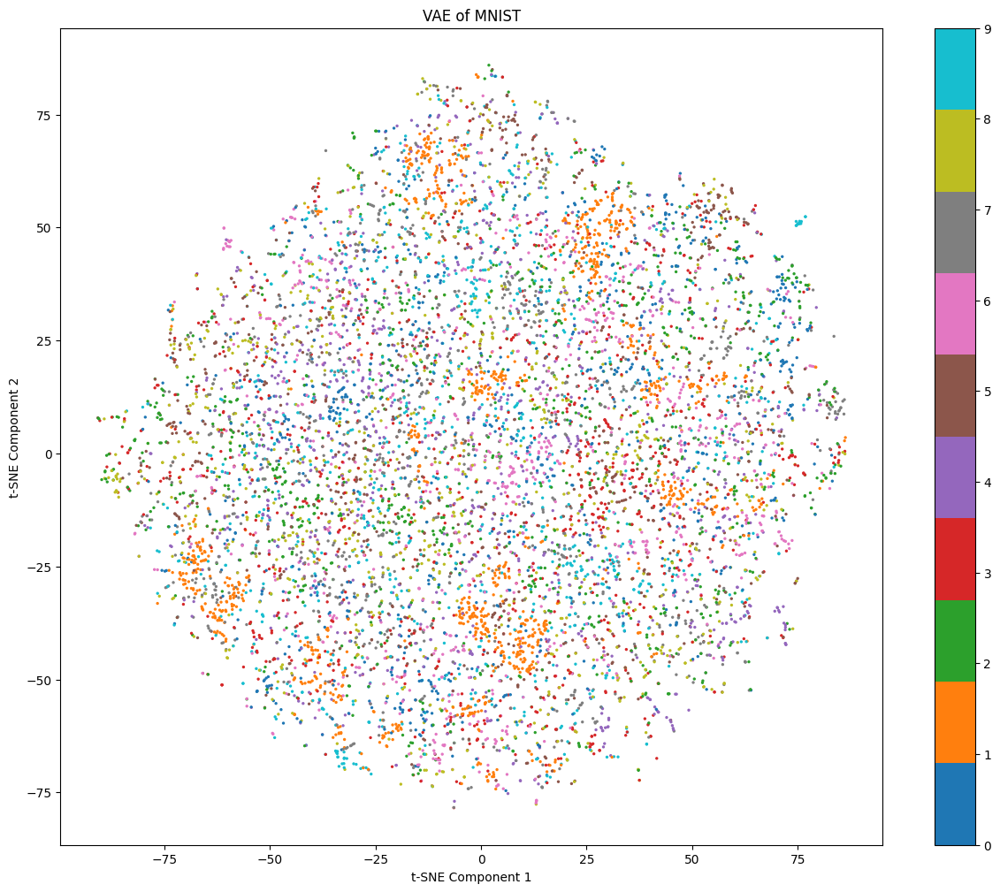

In [ ]:
# Plotting with Matplotlib
plt.figure(figsize=(15, 12))
scatter = plt.scatter(latent_vecs_tsne[:,0], latent_vecs_tsne[:,1], c = labels.astype(int), cmap='tab10', s=2)
plt.colorbar(scatter)
plt.title('VAE of MNIST')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?

Видно, что CVAE в отличие от VAE в латентном пространстве классы все смешаны и не разделяются в кластеры - в этом есть смысл, т.к. из любого латентного вектора можно сгенерировать любой класс, поэтому в окрестности люого латентного вектора должны быть вектора всех классов

# BONUS 1: Denoising

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума.
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом.

В питоне шум можно добавить так:

In [ ]:
noise_factor = 0.5
X_noisy = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)

NameError: name 'X' is not defined

In [ ]:
<тут ваш код обучения автоэнкодера на зашумленных картинках. Не забудтье разбить на train/test!>

SyntaxError: invalid syntax (<ipython-input-50-032e3e0cfbcf>, line 1)

In [ ]:
<тут проверка, как AE убирает щум с тестовых картинок. Надеюсь, все получилось =)>

# BONUS 2: Image Retrieval

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентныз представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [ ]:
codes = <поучите латентные представления картинок из трейна>

SyntaxError: invalid syntax (<ipython-input-1-2c659ea51e4b>, line 1)

In [ ]:
# обучаем LSHForest
from sklearn.neighbors import LSHForest
lshf = LSHForest(n_estimators=50).fit(codes)

In [ ]:
def get_similar(image, n_neighbors=5):
  # функция, которая берет тестовый image и с помощью метода kneighbours у LSHForest ищет ближайшие векторы
  # прогоняет векторы через декодер и получает картинки ближайших людей

  code = <получение латентного представления image>

  (distances,),(idx,) = lshf.kneighbors(code, n_neighbors=n_neighbors)

  return distances, X_train[idx]

In [ ]:
def show_similar(image):

  # функция, которая принимает тестовый image, ищет ближайшие к нему и визуализирует результат

    distances,neighbors = get_similar(image,n_neighbors=11)

    plt.figure(figsize=[8,6])
    plt.subplot(3,4,1)
    plt.imshow(image.cpu().numpy().transpose([1,2,0]))
    plt.title("Original image")

    for i in range(11):
        plt.subplot(3,4,i+2)
        plt.imshow(neighbors[i].cpu().numpy().transpose([1,2,0]))
        plt.title("Dist=%.3f"%distances[i])
    plt.show()

In [ ]:
<тут выведите самые похожие лица к какому-нибудь лицу из тестовой части датасета>